In [1]:
import warnings
warnings.filterwarnings("ignore")

import torch
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

from mmpe.wholebody_estimator import WholeBodyEstimator

from IPython.display import display

In [2]:
img_path = "../examples/image1.jpg"
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

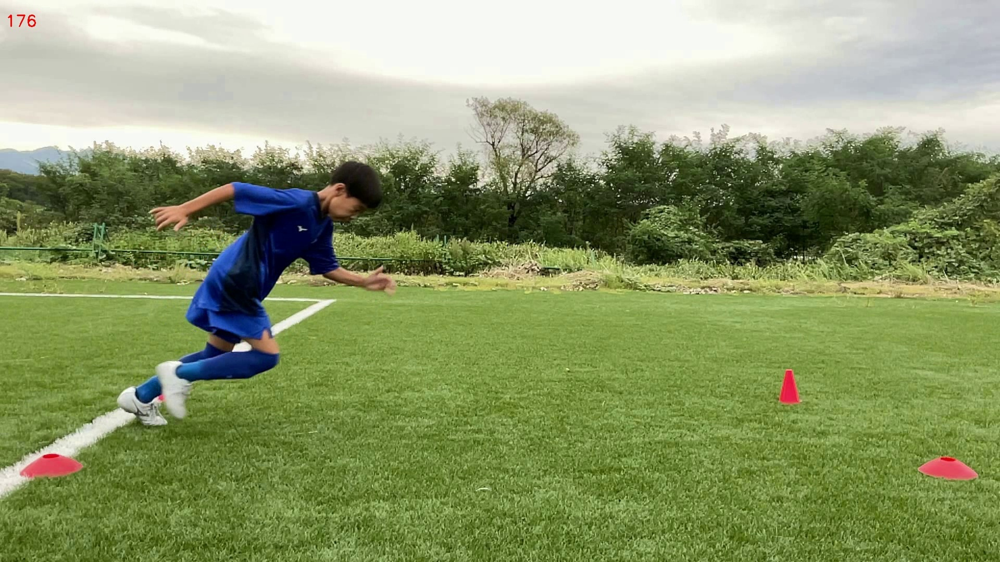

In [3]:
display(Image.fromarray(img))

In [4]:
POSE_CONFIG = "../models/rtmpose-l_8xb32-270e_coco-wholebody-384x288.py"
POSE_CHECKPOINT = "../models/rtmpose-l_simcc-coco-wholebody_pt-aic-coco_270e-384x288-eaeb96c8_20230125.pth"
DET_CONFIG = "../models/rtmdet_m_8xb32-300e_coco.py"
DET_CHECKPOINT = "../models/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth"

In [5]:
mmpose_estimator = WholeBodyEstimator(POSE_CONFIG, POSE_CHECKPOINT, DET_CONFIG, DET_CHECKPOINT)

Loads checkpoint by local backend from path: ../models/rtmpose-l_simcc-coco-wholebody_pt-aic-coco_270e-384x288-eaeb96c8_20230125.pth
Loads checkpoint by local backend from path: ../models/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std



In [6]:
mmpose_estimator.predict(img)

bboxes = mmpose_estimator.get_bboxes()
keypoints = mmpose_estimator.get_keypoints()

body = mmpose_estimator.get_body_keypoints()
foot = mmpose_estimator.get_foot_keypoints()
face = mmpose_estimator.get_face_keypoints()
hand = mmpose_estimator.get_hand_keypoints()

01/15 23:05:11 - mmengine - WARNING - The current default scope "mmdet" is not "mmpose", `init_default_scope` will force set the currentdefault scope to "mmpose".


In [7]:
plotted_img = img.copy()

for x, y in body:
    cv2.circle(plotted_img, (int(x), int(y)), 5, (0, 555, 0), -1)

for x, y in foot:
    cv2.circle(plotted_img, (int(x), int(y)), 5, (0, 0, 255), -1)
    
for x, y in face:
    cv2.circle(plotted_img, (int(x), int(y)), 5, (255, 255, 0), -1)

for x, y in hand:
    cv2.circle(plotted_img, (int(x), int(y)), 5, (255, 0, 255), -1)

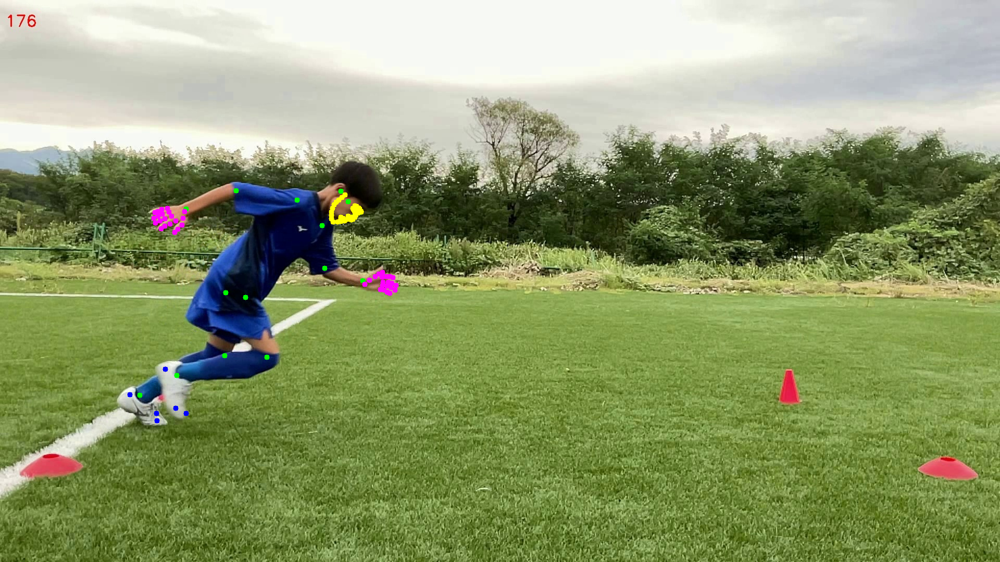

In [8]:
display(Image.fromarray(plotted_img))

In [11]:
connections = [[1,2],[3,4],[5,6],[7,8],[9,10],[11,12],[13,14],[15,16],[17,20],[18,21],[19,22]]
line_color: tuple = (0, 255, 0)

for connection in connections:
    start = keypoints[connection[0]-1]
    end = keypoints[connection[1]-1]
    cv2.line(plotted_img, (int(start[0]), int(start[1])), (int(end[0]), int(end[1])), line_color, 2)

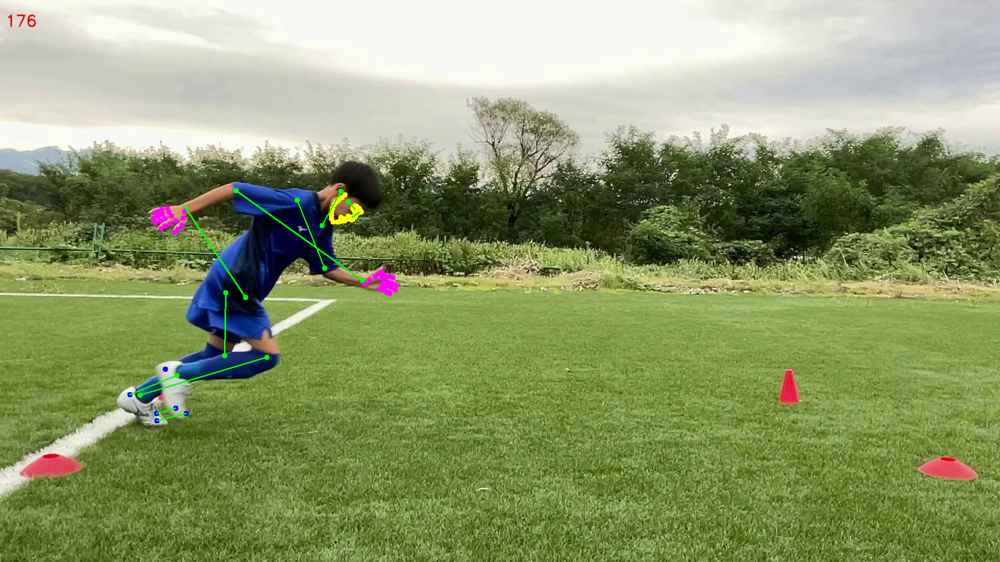

In [12]:
display(Image.fromarray(plotted_img))